# Исследование рынка заведений общественного питания Москвы 

**Задачи исследования**

Сделать исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия заведения.

**Описание данных**

Для исследования предоставлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Файл `moscow_places.csv`:
* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽» и так далее;
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    * 0 — заведение не является сетевым
    * 1 — заведение является сетевым
* `district` — административный район, в котором находится заведение, например Центральный административный округ;
* `seats` — количество посадочных мест.

**Содержание работы**

* [Обзор данных](#1)
* [Предобработка данных](#2)
    * [Проверка наличия дубликатов](#2.1)
    * [Проверка наличия пропусков](#2.2)
    * [Обработка аномальных значений](#2.3)
    * [Добавление столбцов в таблицу](#2.4)
* [Анализ данных](#3)
    * [Анализ категорий заведений, представленных в данных](#3.1)
    * [Анализ количества посадочных мест в заведениях по категориям](#3.2)
    * [Анализ соотношения сетевых и несетевых заведений в датасете](#3.3)
    * [Анализ ТОП-15 популярных сетей в Москве](#3.4)
    * [Анализ заведений по административным районам Москвы](#3.5)
    * [Анализ рейтингов заведений по категориям](#3.6)
    * [Построение фоновой картограммы (хороплета) со средним рейтингом](#3.7)
    * [Отображение всех заведений датасета на карте](#3.8)
    * [Анализ ТОП-15 улиц по количеству заведений](#3.9)
    * [Анализ улиц, на которых находится только один объект общепита](#3.10)
    * [Построение фоновой картограммы (хороплета) со средним чеком заведений](#3.11)
* [Общие выводы](#4)
* [Детализация исследования: открытие кофейни](#5)
    * [Анализ расположения кофеен](#5.1)
    * [Анализ времени работы кофеен](#5.2)
    * [Анализ рейтинга кофеен и их распределения по районам](#5.3)
    * [Анализ стоимости чашки капучино](#5.4)
    * [Рекомендации по открытию кофейни](#5.5)

In [1]:
# Импорт необходимых библиотек
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go 
import plotly.express as px
import plotly.graph_objects as go
from matplotlib.pyplot import show

# Импорт карты и хороплета
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

<a id="1"></a> 
## Обзор данных 

Выгрузка данных из файла

In [2]:
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
# Вывод основной информации по датасету
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


В датасете присутствуют пропуски и возможно наличие выбросов

<a id="2"></a> 
## Предобработка данных

<a id="2.1"></a> 
### Проверка наличия дубликатов

In [5]:
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


Проверка наличия неявных дубликатов

In [6]:
# Приведем названия в столбцах с названием кофеен и с адресом к нижнему регистру

data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

# Проверим на наличие дубликатов в столбцах с названием и адресом
data[data.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


В таблице есть четыре дубликата кафе, удалим данные дубликаты

In [7]:
data = data.drop_duplicates(subset=['name', 'address'])

data.duplicated(['name', 'address']).sum()

0

<a id="2.2"></a> 
### Проверка наличия пропусков

In [8]:
data.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7867
middle_avg_bill      5253
price                5087
avg_bill             4586
seats                3610
hours                 535
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

В таблице присутствует большое количество пропусков. Заполнить такие данные случайными значениями без искажений нельзя. На данном этапе оставим пропуски без изменений и, при возможности, обработаем пропуски далее.

<a id="2.3"></a> 
### Обработка аномальных значений

В данных встречаются заведения с количеством посадочных мест `1288`, что значительно превышает среднее количество мест и может являться выбросом. Рассмотрим данный показатель поподробнее. 

Построение диаграммы размаха для количества посадочных мест

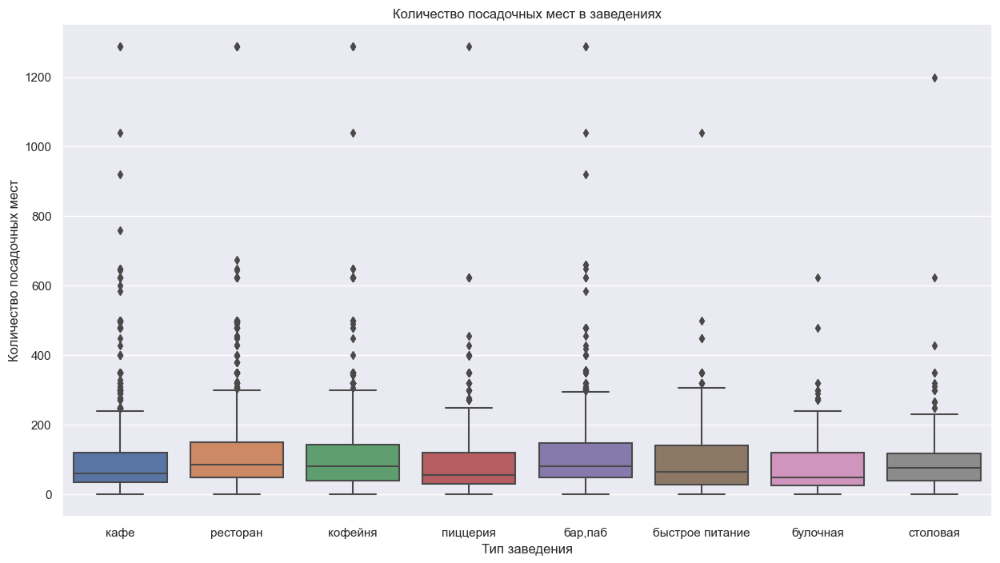

In [10]:
sns.boxplot(x='category', y='seats', data=data)
sns.set(rc={'figure.figsize':(15,8)})
plt.title('Количество посадочных мест в заведениях')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

Подсчет количества аномальных значений для посадочных мест. Возьмем за аномальные значения количества мест более `550`.

In [11]:
print('Количество заведений с посадочными местами более 550:', data[data['seats'] > 550]['name'].count())
print('Количество аномальных значений составляет:', round(data[data['seats'] > 550]['name'].count()/data['name'].count()*100, 2),'%')

Количество заведений с посадочными местами более 550: 56
Количество аномальных значений составляет: 0.67 %


Количество заведений с аномальными значениями посадочных мест составляет менее 1%. Такие данные можно удалить, т.к. это не окажет влияния на результаты исследования.

In [12]:
abnormal_seats = data.query('seats > 550')

data = data.query('index not in @abnormal_seats.index')

print('Количество заведений с посадочными местами более 550:', data[data['seats'] > 550]['name'].count())

Количество заведений с посадочными местами более 550: 0


В данных встречаются заведения со средней ценой одной чашки капучино `1568`, что значительно превышает среднюю стоимость чашки и может являться выбросом. Рассмотрим данный показатель поподробнее

Построение диаграммы размаха для цены одной чашки капучино

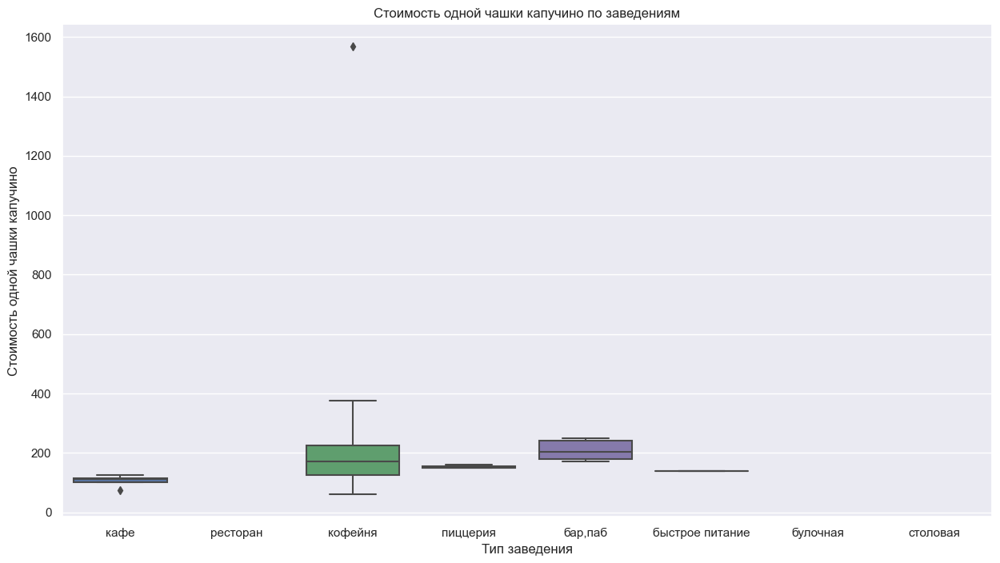

In [13]:
sns.boxplot(x='category', y='middle_coffee_cup', data=data)
sns.set(rc={'figure.figsize':(15,8)})
plt.title('Стоимость одной чашки капучино по заведениям')
plt.xlabel('Тип заведения')
plt.ylabel('Стоимость одной чашки капучино')
plt.show()

Подсчет количества аномальных значений для стоимости чашки капучино. Возьмем за аномальные значения стоимостью более `400`.

In [14]:
print('Количество заведений со стоимостью чашки капучино более 400 рублей:', data[data['middle_coffee_cup'] > 400]['name'].count())
print('Количество аномальных значений составляет:', round(data[data['middle_coffee_cup'] > 400]['name'].count()/data['name'].count()*100, 2),'%')

Количество заведений со стоимостью чашки капучино более 400 рублей: 1
Количество аномальных значений составляет: 0.01 %


Стоимость чашки капучино более `1568` рублей присутствует только в одном заведении, что скорее всего является ошибкой в данных. Удалим данное значение.

In [15]:
abnormal_cup = data.query('middle_coffee_cup > 400')

data = data.query('index not in @abnormal_cup.index')

print('Количество заведений со стоимостью чашки капучино более 400 рублей:', data[data['middle_coffee_cup'] > 400]['name'].count())

Количество заведений со стоимостью чашки капучино более 400 рублей: 0


<a id="2.4"></a> 
### Добавление столбцов в таблицу

Добавим столбцец `street` с названиями улиц из столбца с адресом

In [16]:
data['street'] = data['address'].str.split(', ').str[1]

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


Создание столбца `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
* `True` — если заведение работает ежедневно и круглосуточно;
* `False` — в противоположном случае.

In [17]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


**Вывод:** На стадии предобработки данных было сделано следующее:
* Удалены аномальные значения в cтолбцах с количеством посадочных мест `seats` и стоимостью одной чашки капучино `middle_coffee_cup`. Было удалено менее 1% данных
* Добавлены дополнительные столбцы `street` с названиями улиц и `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно.

<a id="3"></a> 
## Анализ данных

<a id="3.1"></a> 
### Анализ категорий заведений, представленых в данных

Проанализируем, какие категории заведений представлены в данных.

In [18]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Подсчет количества заведений по категориям

In [19]:
category_name = (data.groupby('category')['name'].count()
                 .reset_index()
                 .sort_values(by='name', ascending=False))
category_name.columns = ['category_name', 'count']

category_name

,category_name,count
3,кафе,2362
6,ресторан,2030
4,кофейня,1400
0,"бар,паб",754
5,пиццерия,629
2,быстрое питание,602
7,столовая,313
1,булочная,255


Построение диаграммы распределения заведений по категориям

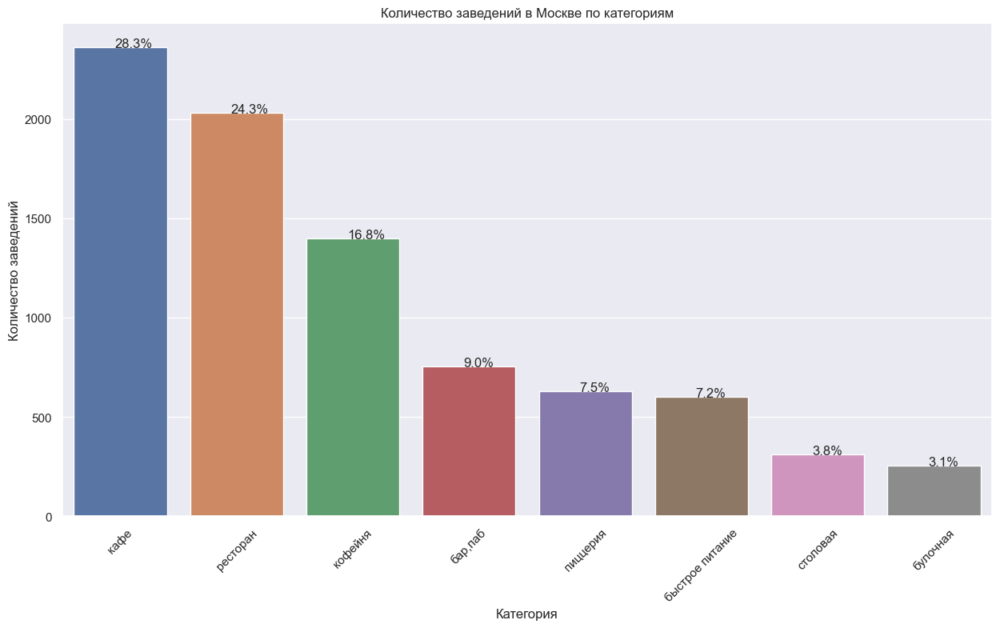

In [20]:
def without_hue(plot, feature):
    total = category_name['count'].sum()
    for p in ax.patches:
        percentage = '{:.1f}%'.format(p.get_height()/total*100)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)
    plt.show()

    
ax = sns.barplot(data = category_name, x='category_name', y = 'count')

ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
ax.set_title('Количество заведений в Москве по категориям')
plt.xticks(rotation=45)

#

without_hue(ax, category_name)



**Вывод:** Самое большое количество заведений приходится на кафе (2364) - 28,3% -  и рестораны (2031) - 24,3%, меньше всего на булочные (255) - 3.1%. На кафе и рестораны приходится более половины всех заведений - 52,6%.

<a id="3.2"></a> 
### Анализ количества посадочных мест в заведениях по категориям

Подсчет общего количества посадочных мест по категориям заведений

In [21]:
total_seats_count = data.groupby('category')['seats'].count().reset_index()
total_seats_count.columns = ['category_name', 'seats_count']

total_seats_count.sort_values(by='seats_count', ascending=False)

,category_name,seats_count
6,ресторан,1257
3,кафе,1203
4,кофейня,738
0,"бар,паб",457
5,пиццерия,423
2,быстрое питание,348
7,столовая,162
1,булочная,147


Подсчет среднего количества посадочных мест по категориям заведений

In [22]:
avg_seats_count = data.groupby('category')['seats'].mean().reset_index().sort_values(by='seats', ascending=False)
avg_seats_count.columns = ['category_name', 'seats_avg']

round(avg_seats_count)

,category_name,seats_avg
6,ресторан,115.0
0,"бар,паб",109.0
4,кофейня,101.0
2,быстрое питание,96.0
7,столовая,90.0
3,кафе,89.0
5,пиццерия,88.0
1,булочная,86.0


Построение столбчатой диаграммы для визуализации среднего количества посадочных мест в заведениях в Москве по категориям заведений

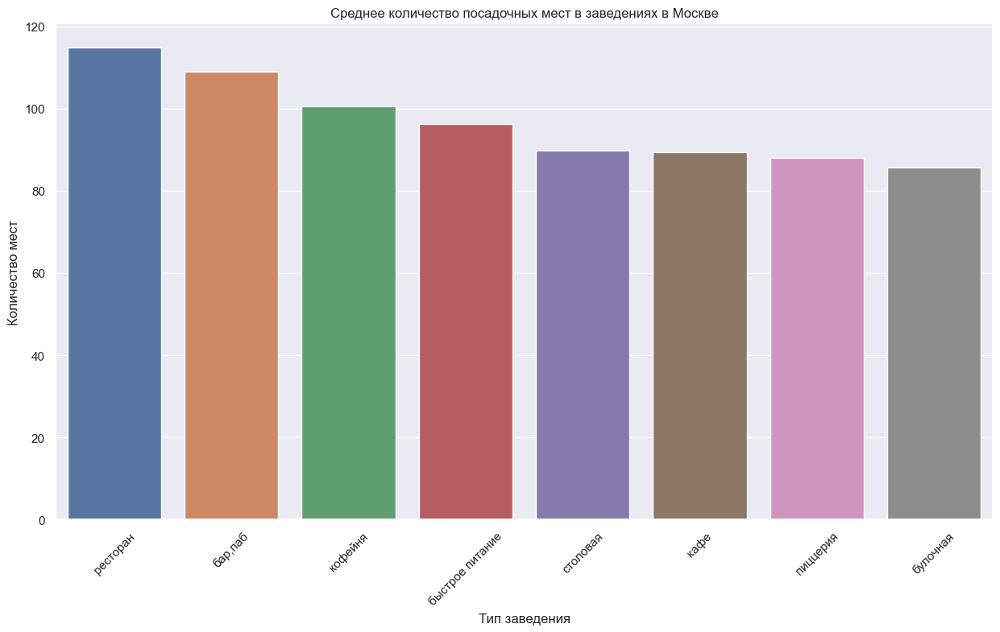

In [23]:
ax = sns.barplot(data = avg_seats_count, x = 'category_name', y = 'seats_avg')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Среднее количество посадочных мест в заведениях в Москве')
plt.xticks(rotation=45)
plt.show()

Подсчет медианного количества посадочных мест по категориям заведений

In [24]:
median_seats_count = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)
median_seats_count.columns = ['category_name', 'seats_median']

round(median_seats_count)

,category_name,seats_median
6,ресторан,86.0
0,"бар,паб",80.0
4,кофейня,78.0
7,столовая,75.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,52.0
1,булочная,50.0


Построение столбчатой диаграммы для визуализации медианного количества мест в заведениях Москвы по категориям заведений

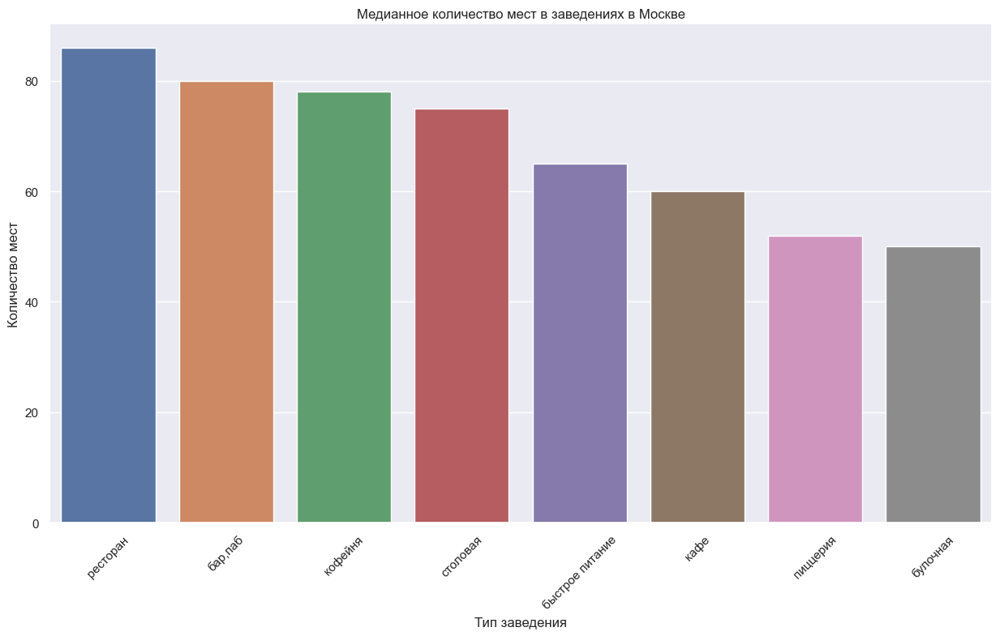

In [25]:
ax = sns.barplot(data = median_seats_count, x = 'category_name', y = 'seats_median')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях в Москве')
plt.xticks(rotation=45)
plt.show()

**Вывод:** Самое большое количество посадочных мест в ресторанах и барах, где проводятся массовые мероприятия и люди проводят больше времени. В заведениях быстрого питания количество посадочных мест меньше. 

<a id="3.3"></a> 
### Анализ соотношения сетевых и несетевых заведений в датасете.

Расчет количества сетевых и несетевых заведений

In [26]:
chain_count = data.groupby('chain')['name'].count().reset_index()
chain_count.columns = ['chain', 'count']

chain_count

,chain,count
0,0,5169
1,1,3176


Построение круговой диаграммы для визуализации соотношения сетевых и несетевых заведений.

In [27]:
fig = go.Figure(data=[go.Pie(labels=chain_count['chain'], values= chain_count['count'], title = 'Круговая диаграмма соотношения сетевых и несетевых заведений')])
fig.show() 

**Вывод:** Количество несетевых заведений значительно больше, составляет 5171 заведение, 61.9% от общего числа заведений. Сетевых 3178, 38.1%

Расчет количества сетевых заведений по категории заведения

In [28]:
chain_places = (data.query('chain == 1')
                .groupby('category')['name'].count()
                .reset_index()
                .sort_values(by='name', ascending=False))
chain_places.columns = ['category_name', 'count']

chain_places

,category_name,count
3,кафе,774
6,ресторан,721
4,кофейня,712
5,пиццерия,328
2,быстрое питание,231
0,"бар,паб",167
1,булочная,156
7,столовая,87


Построение столбчатой диаграммы для визуализации количества сетевых заведений в Москве по категориям

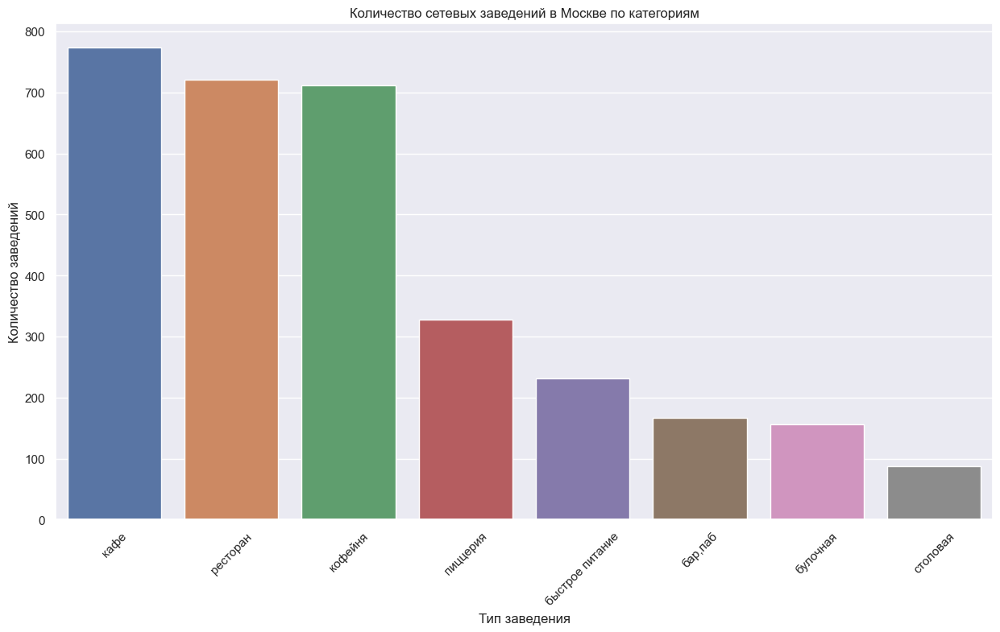

In [29]:
ax = sns.barplot(data = chain_places, x = 'category_name', y = 'count')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество заведений')
ax.set_title('Количество сетевых заведений в Москве по категориям')
plt.xticks(rotation=45)
plt.show()

Расчет количества несетевых заведений по категории заведения

In [30]:
nochain_places = (data.query('chain == 0')
                .groupby('category')['name'].count()
                .reset_index()
                .sort_values(by='name', ascending=False))
nochain_places.columns = ['category_name', 'count']

nochain_places

,category_name,count
3,кафе,1588
6,ресторан,1309
4,кофейня,688
0,"бар,паб",587
2,быстрое питание,371
5,пиццерия,301
7,столовая,226
1,булочная,99


Построение столбчатой диаграммы для визуализации количества несетевых заведений в Москве по категориям

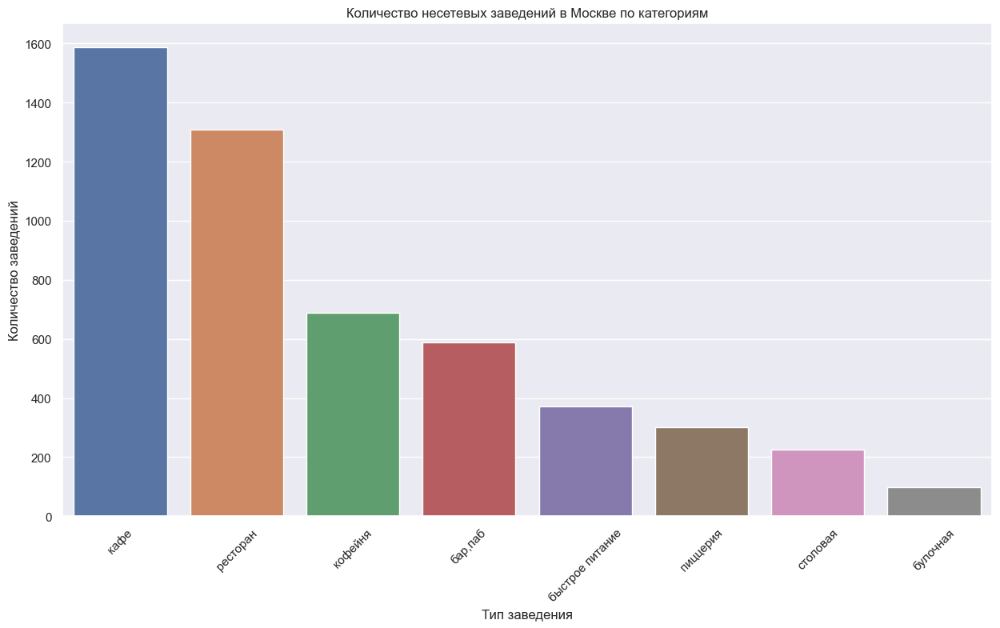

In [31]:
ax = sns.barplot(data = nochain_places, x = 'category_name', y = 'count')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество заведений')
ax.set_title('Количество несетевых заведений в Москве по категориям')
plt.xticks(rotation=45)
plt.show()

Визуализация соотношения сетевых и несетевых заведений

In [32]:
# Построение таблицы с количествоб сетевых и несетвых заведений по категориям
all_places = pd.merge(chain_places, nochain_places, on='category_name', how='outer')
all_places.columns = ['category_name', 'chain_count', 'nochain_count']

all_places

,category_name,chain_count,nochain_count
0,кафе,774,1588
1,ресторан,721,1309
2,кофейня,712,688
3,пиццерия,328,301
4,быстрое питание,231,371
5,"бар,паб",167,587
6,булочная,156,99
7,столовая,87,226


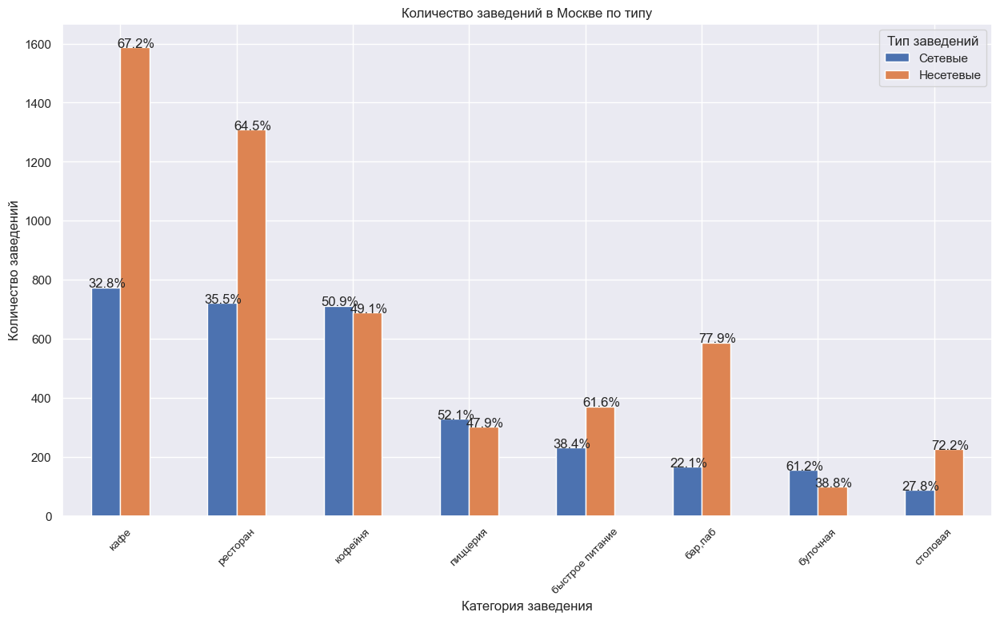

In [33]:
# Функция для расчета процентного соотношения
def with_hue(plot, feature, Number_of_categories, hue_categories):
    a = [p.get_height() for p in plot.patches]
    patch = [p for p in plot.patches]
    for i in range(Number_of_categories):
        total = all_places.loc[i, 'chain_count'] + all_places.loc[i, 'nochain_count']
        for j in range(hue_categories):
            percentage = '{:.1f}%'.format(100 * a[(j*Number_of_categories + i)]/total)
            x = patch[(j*Number_of_categories + i)].get_x() + patch[(j*Number_of_categories + i)].get_width() / 2 - 0.15
            y = patch[(j*Number_of_categories + i)].get_y() + patch[(j*Number_of_categories + i)].get_height() 
            ax.annotate(percentage, (x, y), size = 12)
    plt.show()


# построение столбчатой диграммы по типам заведенйи
ax = all_places.plot(kind='bar', xlabel='category_name', )
ax.legend(["Сетевые", "Несетевые"], title='Тип заведений')
ax.set_xlabel('Категория заведения')
ax.set_ylabel('Количество заведений')
ax.set_title('Количество заведений в Москве по типу')
ax.set_xticklabels(all_places['category_name'], rotation='vertical', fontsize=10)
plt.xticks(rotation=45)

with_hue(ax, all_places, 8, 2)

**Вывод:** Несетевые заведения преобладают почти по всем категориям, кроме:
* кофеен 712/688
* пиццерий 328/301
* булочных 156/99

<a id="3.4"></a> 
### Анализ ТОП-15 популярных сетей в Москве

Формирование таблицы с ТОП-15 популярных сетей в Москве

In [34]:
top15_chain_places = (data.query('chain == 1')
                      .groupby('name').agg({'category' : pd.Series.mode, 'chain' : 'count'})
                      .sort_values(by='chain', ascending=False)
                      .reset_index()
                      .rename(columns={'chain':'count'})
                      .head(15))


top15_chain_places

,name,category,count
0,шоколадница,кофейня,117
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,70
4,яндекс лавка,ресторан,68
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,кафе,44
8,кофепорт,кофейня,42
9,теремок,ресторан,38


Построение столбчатой диаграммы для визуализации количества сетевых заведений в Москве, входящих в ТОП-15 по популярности

In [35]:
fig = px.bar(top15_chain_places, x = 'count', y = 'name', color='category')
fig.update_layout(title='ТОП 15 сетевых заведений в Москве',
                  xaxis_title='Количество заведений',
                  yaxis_title='Название заведений',
                  legend_title='Категория')

fig.show()

**Вывод:** Самое популярное сетевое заведение из ТОП 15 - Шоколадница, наименее популярное - Му-Му. Наибольшее количество заведений в ТОП 15 приходится на кофейни - 5, кафе - 4, рестораны - 3, что подпадает под наиболее популярные категории сетевых заведений, рассчитанные ранее. 

<a id="3.5"></a> 
### Анализ заведений по административным районам Москвы

Расчет общего количества заведений по районам

In [36]:
district_total_places = (data.groupby('district')['name'].count()
                         .reset_index()
                         .sort_values(by='name', ascending=False))
district_total_places

,district,name
5,Центральный административный округ,2242
8,Южный административный округ,891
3,Северо-Восточный административный округ,890
2,Северный административный округ,875
1,Западный административный округ,830
0,Восточный административный округ,788
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,706
4,Северо-Западный административный округ,409


Расчет общего количества заведений по районам по категориям заведений

In [37]:
district_category = data.groupby(['district', 'category'])['name'].count().reset_index()

district_category.columns = ['district', 'category', 'count']

district_category.sort_values(by='count', ascending=False).head(15)

,district,category,count
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
3,Восточный административный округ,кафе,269
27,Северо-Восточный административный округ,кафе,269
67,Южный административный округ,кафе,264
59,Юго-Западный административный округ,кафе,236
11,Западный административный округ,кафе,233


Построение столбчатой диаграммы для визуализации общего количества заведений по округам Москвы

In [38]:
fig = px.bar(district_category, x = 'count', y = 'district', color='category')
fig.update_layout(title='Общее количество заведений по категориям по округам Москвы',
                  xaxis_title='Количество заведений',
                  yaxis_title='Округ',
                  legend_title='Категория')
fig.update_layout(yaxis={'categoryorder':'total ascending'})

fig.show()

**Вывод:** Больше всего заведений в Центральном административном округе - 2242, меньше всего в Северо-Западном - 409. Во всех округах преобладают кафе, кофейни и рестораны. Меньше всего столовых.

<a id="3.6"></a> 
### Анализ рейтингов заведений по категориям.

In [39]:
category_rating = (data.groupby('category')['rating'].mean().round(2)        
                    .reset_index()
                    .sort_values('rating', ascending=False))

category_rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


Построение столбчатой диаграммы для визуализации распределения рейтингов по категориям заведений

In [40]:
fig = px.bar(category_rating,
             x='rating',
             y='category',
             text='rating',
             color='category'
            )
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Название категории',
                  showlegend = False)
fig.update_xaxes(range=[4, 4.5])
fig.show()

**Вывод:** Заведения с самым высоким рейтингом относятся к категории "бар,паб" - 4.39. Самый низкий рейтинг у заведений быстрого питания 4.05. У пиццерий, ресторанов , кафе и булочных рейтинг примерно на одном уровне.

<a id="3.7"></a> 
### Построение фоновой картограммы (хороплета) со средним рейтингом заведений каждого района. 

In [41]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)

rating_data.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [42]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самый высокий рейтинг у заведений в Центральном административном округе - 4.38. Самый низкий - в Юго-Восточном административном округе - 4.1.

<a id="3.8"></a> 
### Отображение всех заведений датасета на карте 

In [43]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма, создаёт маркер в текущей точке и добавляет его на карту
def create_clusters(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:** На данной карте видно, что большинство заведений расположено в центре Москвы.

<a id="3.9"></a> 
### Анализ топ-15 улиц по количеству заведений. 

Формирование сводной таблицы с ТОП-15 улицами по количеству заведений

In [44]:
top15_streets = data['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street', 'count']
top15_streets

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,88
5,каширское шоссе,77
6,варшавское шоссе,76
7,ленинградский проспект,72
8,ленинградское шоссе,70
9,мкад,65


Формирование сводной таблицы с количеством заведений по улицам и по категориям.

In [45]:
streets_places = data.groupby(['street', 'category'])['name'].count().reset_index()

streets_places.columns = ['street', 'category', 'count']

streets_places.sort_values('count', ascending=False).head(15)

,street,category,count
2136,проспект мира,кафе,53
1519,мкад,кафе,45
2139,проспект мира,ресторан,45
2137,проспект мира,кофейня,36
2148,профсоюзная улица,кафе,35
1312,ленинский проспект,ресторан,33
2124,проспект вернадского,ресторан,29
1309,ленинский проспект,кафе,26
1304,ленинградское шоссе,ресторан,26
1380,люблинская улица,кафе,26


Сформируем итоговую таблицу с ТОП-15 улиц по количеству заведений с разбивкой по категориям.

In [46]:
top15_streets_categories = streets_places[streets_places.street.isin(top15_streets["street"])]

Построение столбчатой диаграммы для визуализации количества заведений по улицам, входящих в ТОП-15

In [47]:
fig = px.bar(top15_streets_categories, 
             x='count', 
             y='street',                    
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по улицам, входящих в ТОП-15',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   legend_title='Категория',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

**Вывод:** На основании графика можно сделать вывод, что больше всего заведений расположено на проспекте Мира. Преобладают кафе, рестораны и кофейни. На большинстве улиц преобладают кафе и рестораны. На МКАД ситуация отличается, здесь преобладают кафе.

<a id="3.10"></a> 
### Анализ улиц, на которых находится только один объект общепита

Формирование таблицы с улицами, на которых находится только один объект общепита

In [48]:
places_count = data['street'].value_counts().reset_index()

places_count.columns = ['street', 'count']

places_count = places_count.query('count == 1')

places_count

,street,count
990,дорогобужская улица,1
991,ворошиловский парк,1
992,промышленный проезд,1
993,игарский проезд,1
994,парк левобережный,1
...,...,...
1442,парк имени артёма боровика,1
1443,золотая улица,1
1444,улица лобачика,1
1445,котляковская улица,1


Формирование таблицы с названием улицы с одним объектом общепита и его категорией

In [49]:
streets_one_place = streets_places[streets_places.street.isin(places_count["street"])]

streets_one_place

,street,category,count
0,1-й автозаводский проезд,кафе,1
1,1-й балтийский переулок,ресторан,1
2,1-й варшавский проезд,кафе,1
3,1-й вешняковский проезд,кафе,1
7,1-й голутвинский переулок,"бар,паб",1
...,...,...,...
3748,электрический переулок,столовая,1
3769,юго-западный административный округ,кафе,1
3784,якиманский переулок,кафе,1
3785,яковоапостольский переулок,кофейня,1


Формирование сводной таблицы с общим количеством заведений по категориям по улицам с одним объектом

In [50]:
streets_one_place_cat = streets_one_place.groupby('category')['street'].count().reset_index()

streets_one_place_cat.columns = ['category', 'count']

streets_one_place_cat.sort_values(by='count', ascending=False)

,category,count
3,кафе,159
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


Построение столбчатой диаграммы для визуализации распределения количества улиц с одним заведением по категориям заведений

In [51]:
fig = px.bar(streets_one_place_cat, 
             x='count', 
             y='category',                    
             color='category'
            )

fig.update_layout(title='Распределение количетсва улиц с одним заведенеием по категории заведения',
                   xaxis_title='Категория заведения',
                   yaxis_title='Количество улиц',
                   yaxis={'categoryorder':'total ascending'},
                   showlegend = False
                 )
fig.show()

**Вывод:** 458 улиц имеют только одно заведение общепита. Чаще всего - это кафе (160 штук).

### Построение фоновой картограммы (хороплета) со средним чеком заведений каждого района.

Построение сводной таблицы со средним чеком заведений по округам

In [52]:
avg_bill_data = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').round(2)
avg_bill_data.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [53]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Cамый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. Cредний чек центрального округа в среднем отличается в 1,5 - 2 раза от остальных округов.

## Общие выводы

На основании исследования заведений общественного питания Москвы были сделаны следующие выводы. 

* По количеству заведений лидируют кафе с количеством 2364 (28.3%) и рестораны - 2031 (24.3%). Вместе они составляют больше половины от всех заведений - 52.6%. Меньше всего в Москве булочных - 255 (3.1%).

* Самое большое количество посадочных мест в ресторанах и барах, где проводятся массовые мероприятия и люди проводят больше времени. В заведениях быстрого питания количество посадочных мест меньше. Меньше всего посадочных мест в пиццериях и булочных.

* Большинство заведений в Москве являются несетевыми 61.9%. Несетевые заведения преобладают почти по всем категориям, кроме:
    * кофеен 712/688
    * пиццерий 328/301
    * булочных 156/99

* Самая популярная сеть общественного заведения в Москве - Шоколадница. Наибольшее количество заведений в ТОП 15 приходится на кофейни - 5, кафе - 4, рестораны - 3, что подтверждает выводы, сделанные ранее.

* Заведения с самым высоким рейтингом относятся к категории "бар,паб" - 4.39. Самый низкий рейтинг у заведений быстрого питания - 4.05. У пиццерий, ресторанов , кафе и булочных рейтинг примерно на одном уровне.

* Из топ-15 популярных заведений общественного питания больше всего заведений находятся в Центральном административном округе. В основном это кафе, кофейни и рестораны. Примерно одинаковые показатели у Южного, Северного, Северо-Восточного и Западного административных округов. Здесь приоритеты меняются в сторону категории быстрого питания. Меньше всего заведений из топ-15 в Северо-Западном административном округе.

* Больше всего заведений в Центральном административном округе - 2242, меньше всего в Северо-Западном - 409. Во всех округах преобладают кафе, кофейни и рестораны. Меньше всего столовых.

* Самый высокий рейтинг у заведений в Центральном административном округе - 4.38. Самый низкий - в Юго-Восточном административном округе - 4.1.

* Большинство заведений расположено в центре Москвы. Больше всего на проспекте Мира. Преобладают кафе, рестораны и кофейни. На большинстве улиц преобладают кафе и рестораны. На МКАД ситуация отличается, здесь преобладают кафе.

* В Москве есть 458 улиц на которых расположено только одно заведение общественного питания. Больше всего таких заведений относятся к кафе (160).

* Cамый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. Cредний чек центрального округа в среднем отличается в 1,5 - 2 раза от остальных округов.

## Детализиция исследования: открытие кофейни

### Анализ расположения кофеен

Расчет общего количества кофеен в датасете

In [54]:
coffee_data = data[data['category'] == 'кофейня']

print('Общее количество кофеен в датасете:', len(coffee_data))

Общее количество кофеен в датасете: 1400


Расчет количества кофеен по округам

In [55]:
coffee_data_districts = coffee_data.groupby('district')['category'].count().reset_index()

coffee_data_districts.columns = ['district', 'count']

coffee_data_districts.sort_values(by='count', ascending=False)

,district,count
5,Центральный административный округ,428
2,Северный административный округ,186
3,Северо-Восточный административный округ,159
1,Западный административный округ,146
8,Южный административный округ,131
0,Восточный административный округ,103
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [56]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_clusters(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffee_data.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:** В Москве находится 1400 кофеен. Большинство кофеен расположено в Центральном округе - 428. Меньше всего в Восточном, Юго-Западном, Юго-Восточном и Северо-Западном округах. 

### Анализ времени работы кофеен

In [57]:
coffee_24_7 = coffee_data[coffee_data['is_24/7'] == True]
print('Количество круглосуточных кофеен:', len(coffee_24_7))

Количество круглосуточных кофеен: 59


Расчет количества круглосуточных кофеен по округам

In [58]:
coffee_24_7_pivot = (coffee_24_7.groupby('district')['name'].count()
                    .reset_index()
                    .sort_values(by='name', ascending=False))

coffee_24_7_pivot.columns = ['district', 'count']

coffee_24_7_pivot

,district,count
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [59]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_clusters(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:** Количество круглосуточных кофеен в Москве - 59. Большинство из них расположено в центре. 

### Анализ рейтинга кофеен и их распределения по районам

Расчет среднего рейтинга кофеен по округам

In [60]:
coffee_rating = (coffee_data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
                .sort_values('rating', ascending=False))
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
0,Восточный административный округ,4.29
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [61]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний чек кофеен по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самый высокий рейтинг у кофеен, расположенных в Центральном и Северо-Западном административных округах. Самый низкий в Западном административном округе.

### Анализ стоимости чашки капучино

Расчет средней стоимости чашки капучино по округам

In [62]:
cup_of_coffee = (coffee_data.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean')
                 .round(2).sort_values('middle_coffee_cup', ascending=False))

cup_of_coffee

,district,middle_coffee_cup
1,Западный административный округ,188.56
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09
0,Восточный административный округ,140.02


In [63]:
coffee_price = round(cup_of_coffee['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', coffee_price)

Средняя стоимость чашки кофе в Москве: 167.45


In [64]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_of_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Средняя цена стоимости чашки кофе по Москве',
).add_to(m)

# выводим карту
m

**Вывод:** Дороже всего чашка кофе стоит в Западном (188.56) и Центральном (187.52) административных округах. Дешевле всего в Восточном округе (140.02). Средняя стоимость чашки кофе для Москвы - 167.45.

### Рекомендации по открытию кофейни:

На основании проведенного исследования можно дать следующие рекомендации для открытия новой кофейни:

* С точки зрения рейтинга можно рассмотреть Юго-Восточный, Южный, Северо-Восточный и Западный административные округа, так как здесь средний рейтинг ниже, чем в остальных округах. При хорошем уровне сервиса и качества заведение здесь может сдать более успешным, чем у конкурентов. Также здесь можно рассмотреть открытие кофейни с хорошим рейтингом по франшизе, что также может иметь положительный эффект. Если учесть фактор количества кофеен в округе, то можно выделить из этих округов именно Юго-Восточный, т.к. здесь небольшое количество кофеен и меньше конкуренция.

* Если взять за основу среднюю стоимость чашки кофе, то наиболее привлекательны Западный, Центральный и Юго-Западный административные  округа, т.к. здесь будет выше выручка. Но необходимо дополнительно проанализировать затраты на аренду в данных округах, т.к. они могут быть также выше. Также Западный округ имеет самый низкий средний рейтинг среди кофеен.

* При открытии кофейни необходимо ориентироваться на режим работы, если рассматривать открытие в Центральном округе, то желательно сделать выбор в пользу круглосуточного режима работы, так как это один из самых оживленных районов в ночное время. Также необходимо дополнительно проанализировать проходимость и востребованность кофеен с круглосуточным режимом в других районах. Учитывая небольшое количество таких кофеен - это может быть дополнительным конкурентным преимуществом.

Ссылка на презентацию: https://disk.yandex.ru/i/GAvGW0q78tm0mw